# **Unsupervised Learning of Image Segmentation Based on Differentiable Feature Clustering**


https://doi.org/10.48550/arXiv.2007.09990

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
from torch.autograd import Variable
import cv2
import sys
import numpy as np
import torch.nn.init
import random

In [ ]:
scribble=False
nChannel=100
maxIter=100
minLabels=3
lr=0.1
nConv=2
visualize=1
stepsize_sim=1
stepsize_con=1
stepsize_scr=0.5

In [ ]:
input=input("input image file name: ")

input image file name: /content/Image(32).jpg


In [ ]:
# CNN model
class MyNet(nn.Module):
    def __init__(self,input_dim):
        super(MyNet, self).__init__()
        self.conv1 = nn.Conv2d(input_dim, nChannel, kernel_size=3, stride=1, padding=1 )
        self.bn1 = nn.BatchNorm2d(nChannel)
        self.conv2 = nn.ModuleList()
        self.bn2 = nn.ModuleList()
        for i in range(nConv-1):
            self.conv2.append( nn.Conv2d(nChannel, nChannel, kernel_size=3, stride=1, padding=1 ) )
            self.bn2.append( nn.BatchNorm2d(nChannel) )
        self.conv3 = nn.Conv2d(nChannel, nChannel, kernel_size=1, stride=1, padding=0 )
        self.bn3 = nn.BatchNorm2d(nChannel)

    def forward(self, x):
        x = self.conv1(x)
        x = F.relu( x )
        x = self.bn1(x)
        for i in range(nConv-1):
            x = self.conv2[i](x)
            x = F.relu( x )
            x = self.bn2[i](x)
        x = self.conv3(x)
        x = self.bn3(x)
        return x

In [ ]:
# load image
im = cv2.imread(input)
data = torch.from_numpy( np.array([im.transpose( (2, 0, 1) ).astype('float32')/255.]) )
data = Variable(data)

In [ ]:
# load scribble
if scribble:
    mask = cv2.imread(input.replace('.'+input.split('.')[-1],'_scribble.png'),-1)
    mask = mask.reshape(-1)
    mask_inds = np.unique(mask)
    mask_inds = np.delete( mask_inds, np.argwhere(mask_inds==255) )
    inds_sim = torch.from_numpy( np.where( mask == 255 )[ 0 ] )
    inds_scr = torch.from_numpy( np.where( mask != 255 )[ 0 ] )
    target_scr = torch.from_numpy( mask.astype(np.int) )
    target_scr = Variable( target_scr )
    # set minLabels
    minLabels = len(mask_inds)

In [ ]:
# train
model = MyNet( data.size(1) )
model.train()

MyNet(
  (conv1): Conv2d(3, 100, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn1): BatchNorm2d(100, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): ModuleList(
    (0): Conv2d(100, 100, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  )
  (bn2): ModuleList(
    (0): BatchNorm2d(100, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv3): Conv2d(100, 100, kernel_size=(1, 1), stride=(1, 1))
  (bn3): BatchNorm2d(100, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
)

In [ ]:
# similarity loss definition
loss_fn = torch.nn.CrossEntropyLoss()

# scribble loss definition
loss_fn_scr = torch.nn.CrossEntropyLoss()

# continuity loss definition
loss_hpy = torch.nn.L1Loss(size_average = True)
loss_hpz = torch.nn.L1Loss(size_average = True)

/usr/local/lib/python3.10/dist-packages/torch/nn/_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='mean' instead.
  warnings.warn(warning.format(ret))


In [ ]:
HPy_target = torch.zeros(im.shape[0]-1, im.shape[1], nChannel)
HPz_target = torch.zeros(im.shape[0], im.shape[1]-1, nChannel)
optimizer = optim.SGD(model.parameters(), lr=lr, momentum=0.9)
label_colours = np.random.randint(255,size=(100,3))

In [ ]:
from google.colab.patches import cv2_imshow

Output: 


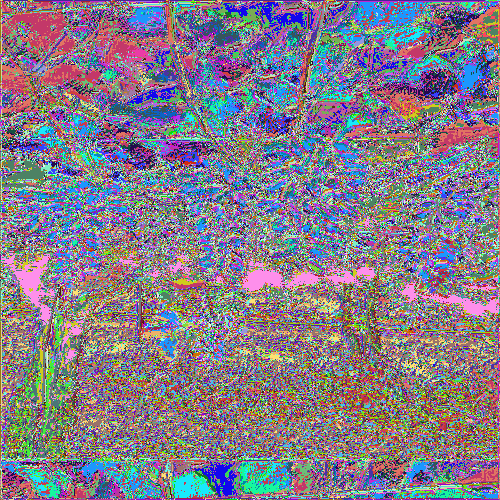

0 / 100 |  label num : 100  | loss : 3.925079345703125
Output: 


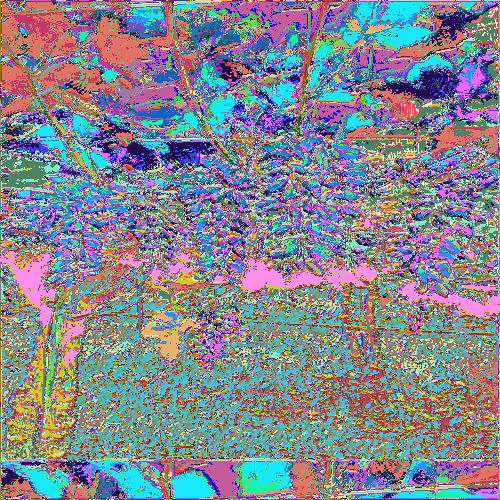

1 / 100 |  label num : 100  | loss : 3.5168228149414062
Output: 


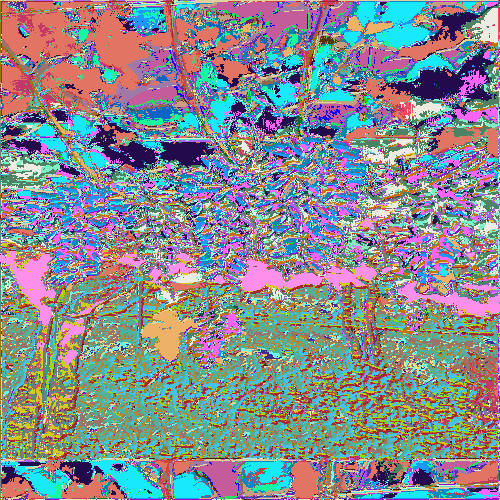

2 / 100 |  label num : 96  | loss : 3.2275285720825195
Output: 


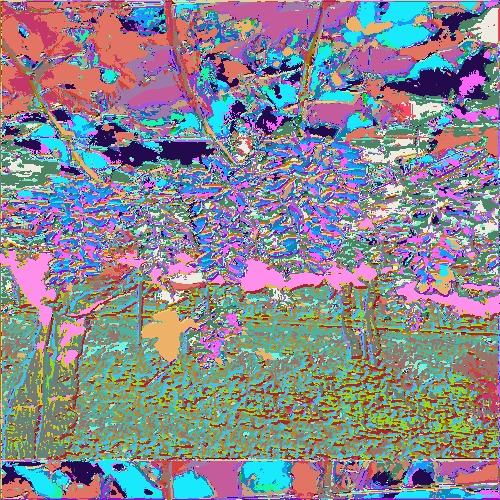

3 / 100 |  label num : 92  | loss : 3.0367650985717773
Output: 


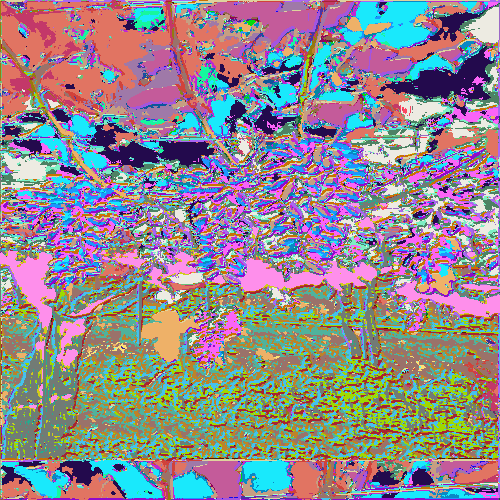

4 / 100 |  label num : 86  | loss : 2.827989339828491
Output: 


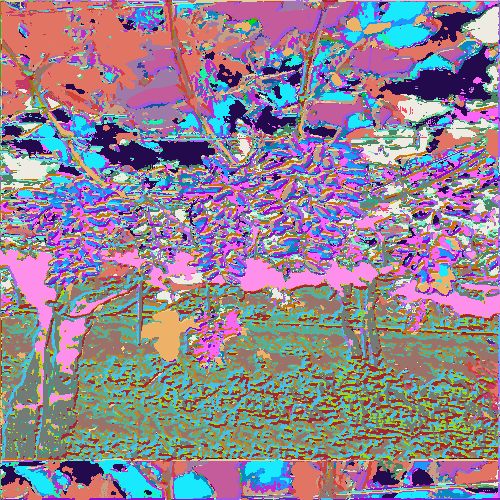

5 / 100 |  label num : 79  | loss : 2.676516056060791
Output: 


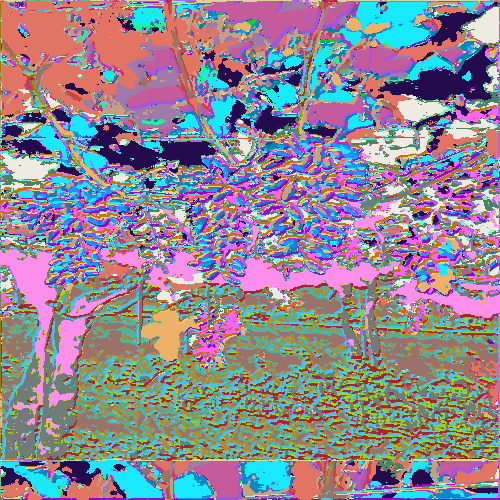

6 / 100 |  label num : 74  | loss : 2.5241751670837402
Output: 


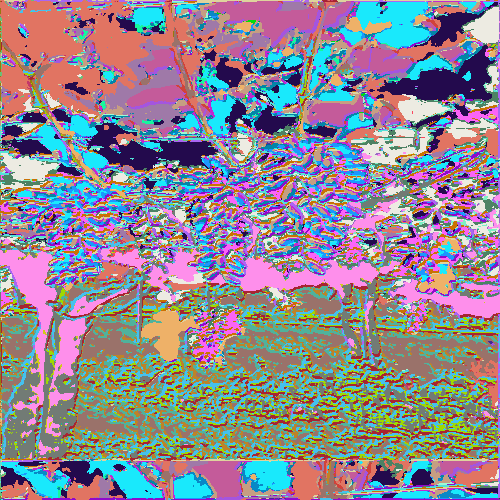

7 / 100 |  label num : 62  | loss : 2.3774900436401367
Output: 


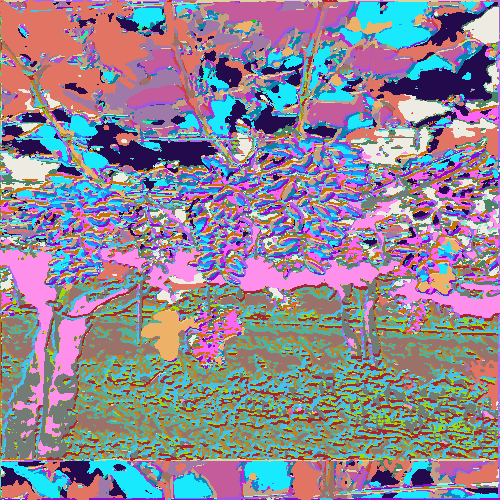

8 / 100 |  label num : 53  | loss : 2.224952220916748
Output: 


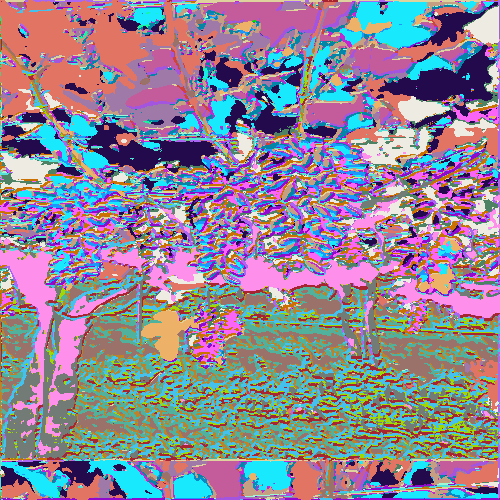

9 / 100 |  label num : 48  | loss : 2.0783610343933105
Output: 


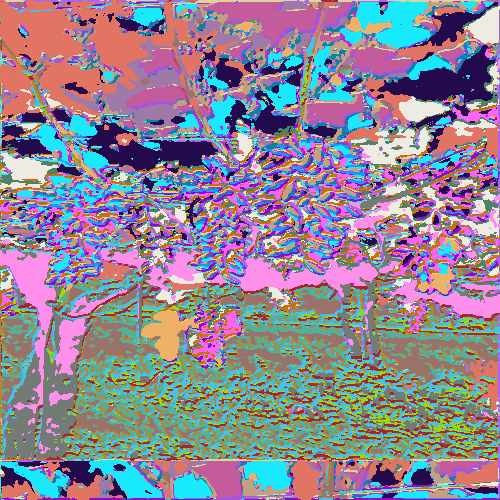

10 / 100 |  label num : 44  | loss : 1.9314496517181396
Output: 


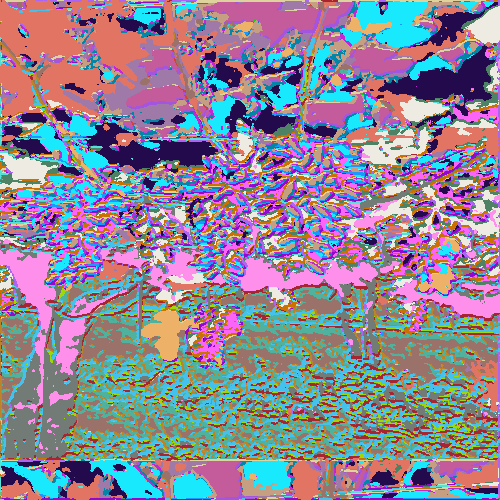

11 / 100 |  label num : 40  | loss : 1.7861287593841553
Output: 


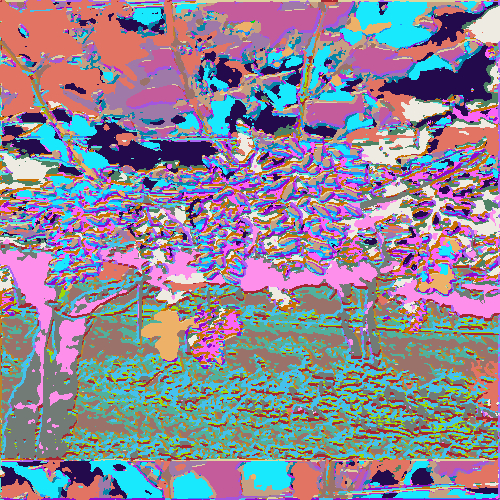

12 / 100 |  label num : 36  | loss : 1.652585744857788
Output: 


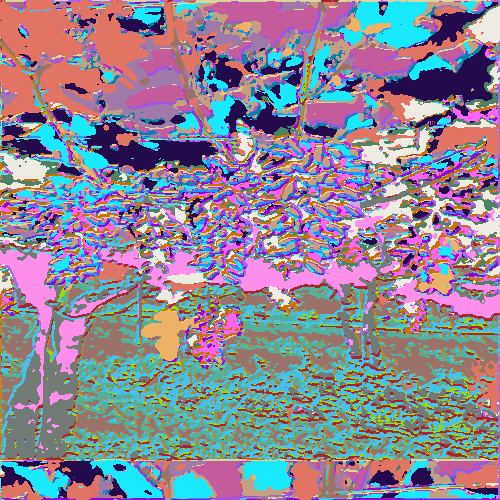

13 / 100 |  label num : 33  | loss : 1.5179799795150757
Output: 


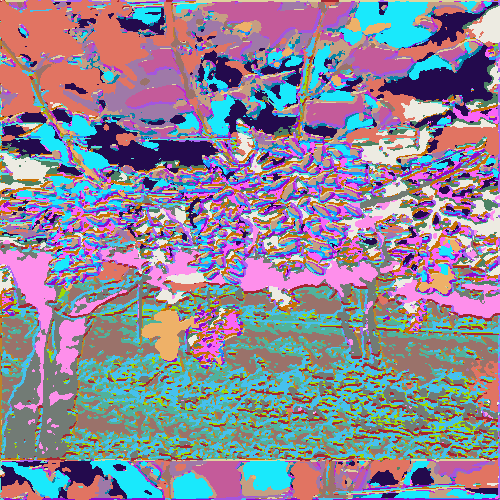

14 / 100 |  label num : 31  | loss : 1.4082847833633423
Output: 


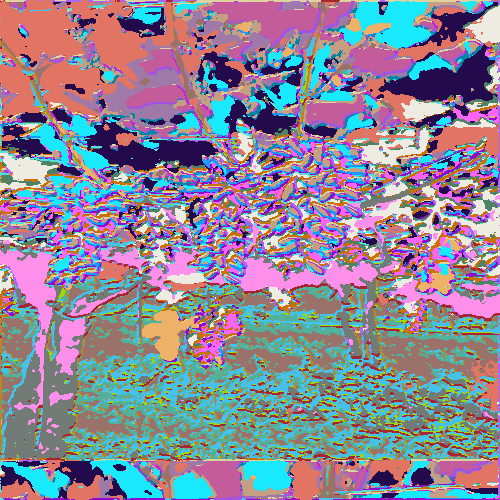

15 / 100 |  label num : 28  | loss : 1.299772024154663
Output: 


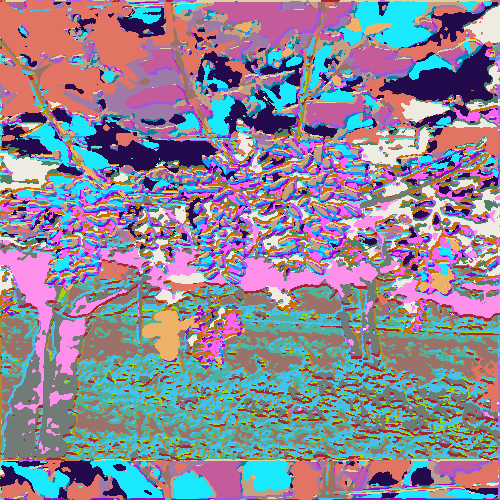

16 / 100 |  label num : 28  | loss : 1.204744577407837
Output: 


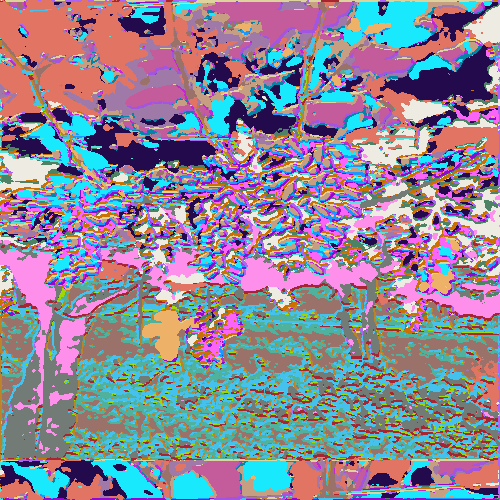

17 / 100 |  label num : 28  | loss : 1.1217050552368164
Output: 


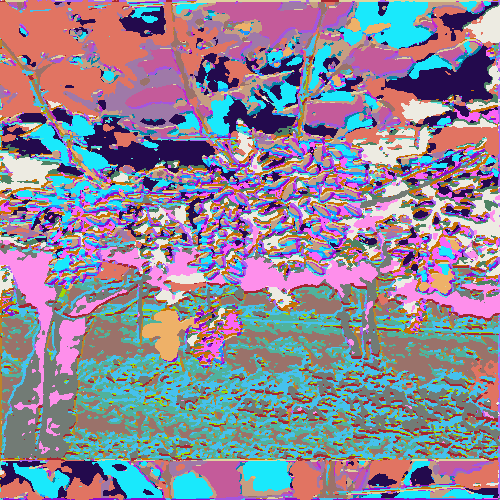

18 / 100 |  label num : 27  | loss : 1.0446724891662598
Output: 


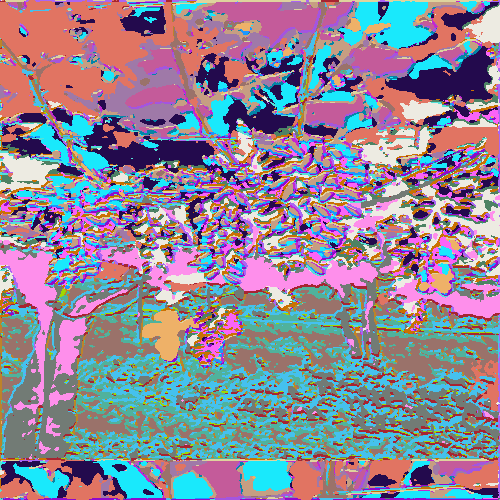

19 / 100 |  label num : 27  | loss : 0.9831740856170654
Output: 


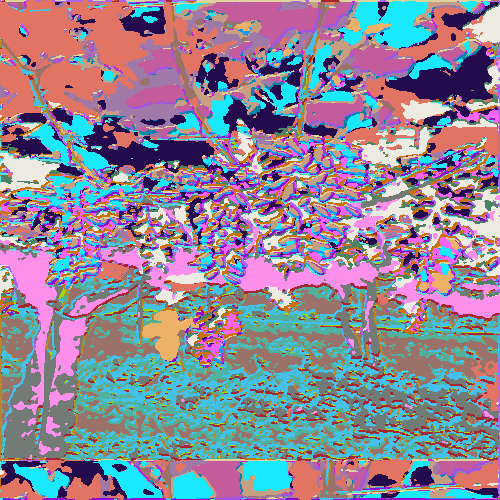

20 / 100 |  label num : 27  | loss : 0.9220710396766663
Output: 


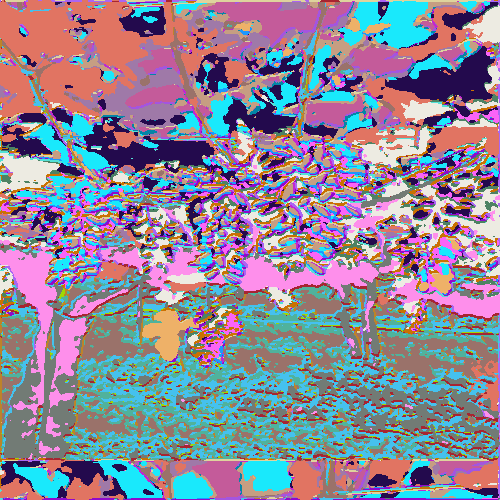

21 / 100 |  label num : 27  | loss : 0.8744540810585022
Output: 


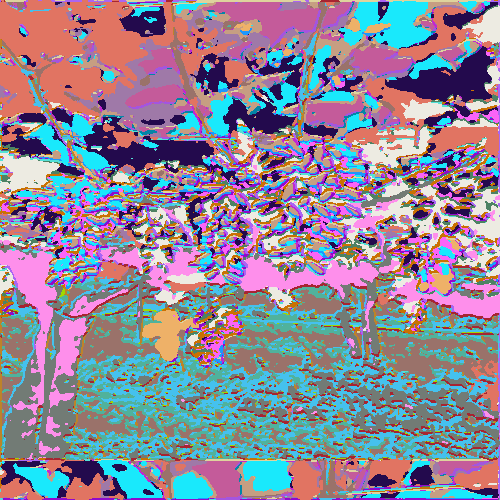

22 / 100 |  label num : 27  | loss : 0.8283724784851074
Output: 


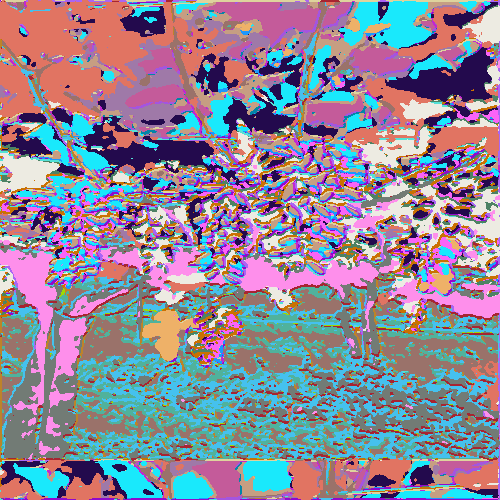

23 / 100 |  label num : 27  | loss : 0.7886869311332703
Output: 


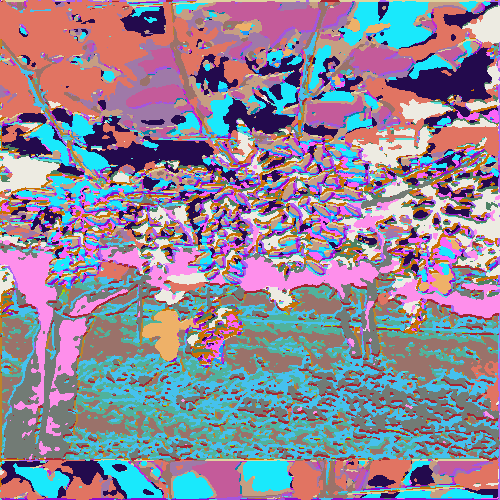

24 / 100 |  label num : 27  | loss : 0.7519255876541138
Output: 


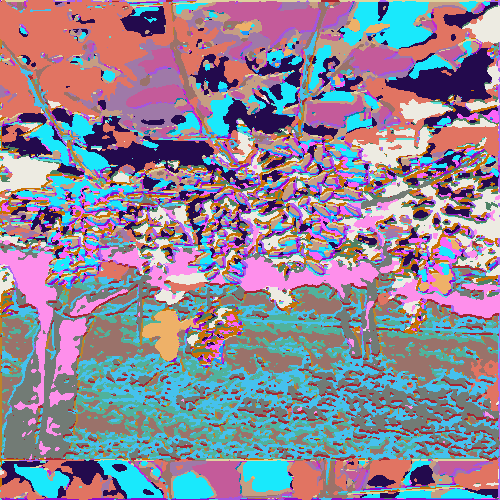

25 / 100 |  label num : 27  | loss : 0.7193536758422852
Output: 


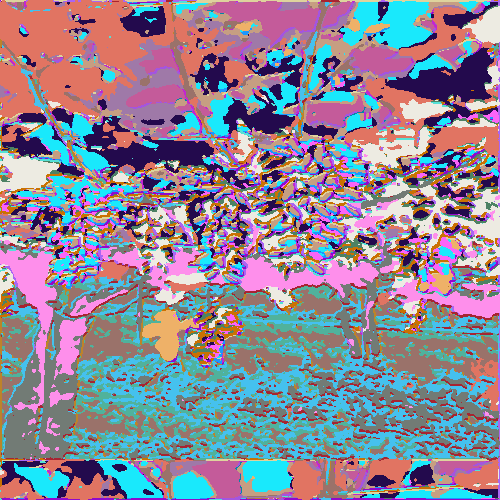

26 / 100 |  label num : 27  | loss : 0.6905970573425293
Output: 


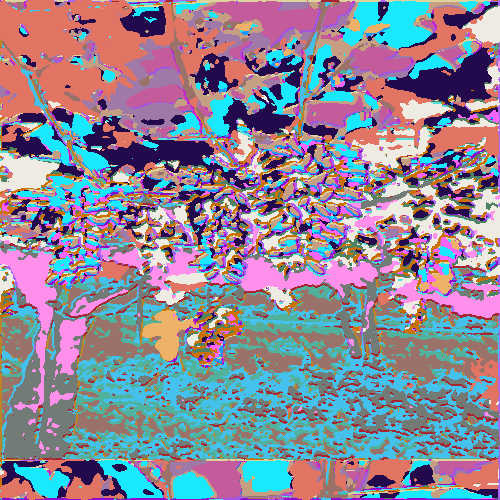

27 / 100 |  label num : 26  | loss : 0.664215624332428
Output: 


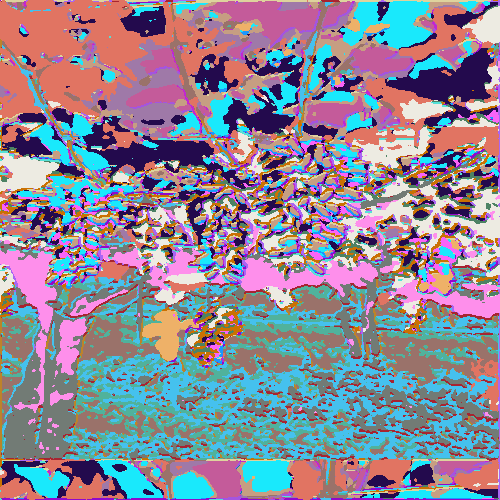

28 / 100 |  label num : 26  | loss : 0.6410146951675415
Output: 


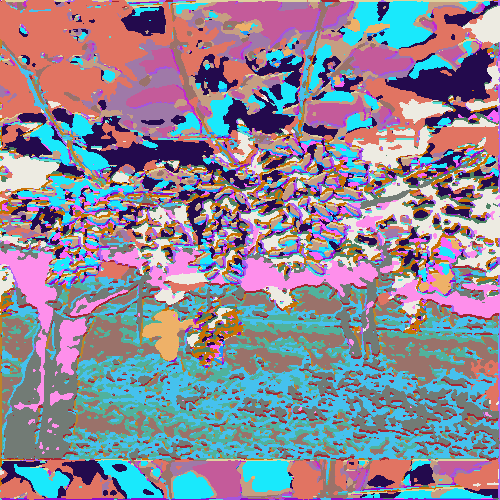

29 / 100 |  label num : 26  | loss : 0.61972975730896
Output: 


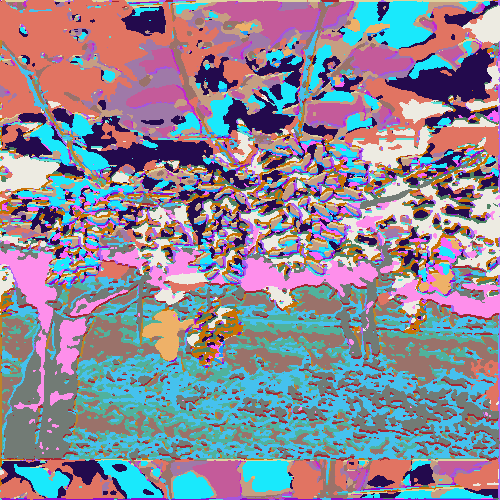

30 / 100 |  label num : 26  | loss : 0.6019673347473145
Output: 


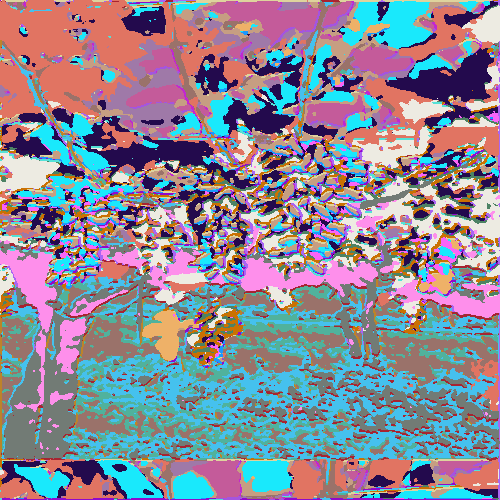

31 / 100 |  label num : 26  | loss : 0.5845808982849121
Output: 


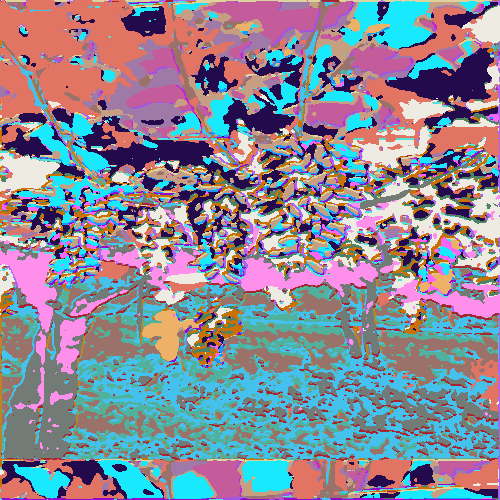

32 / 100 |  label num : 25  | loss : 0.5680714845657349
Output: 


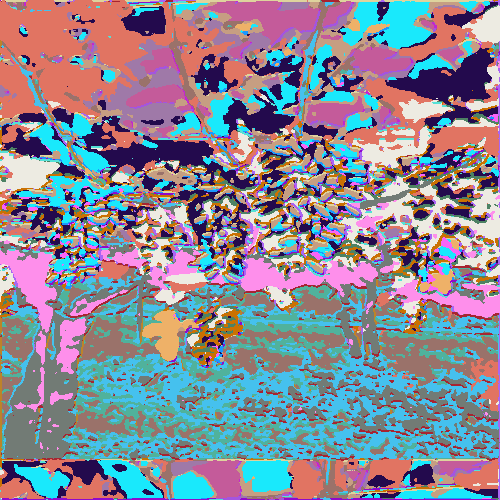

33 / 100 |  label num : 25  | loss : 0.5524270534515381
Output: 


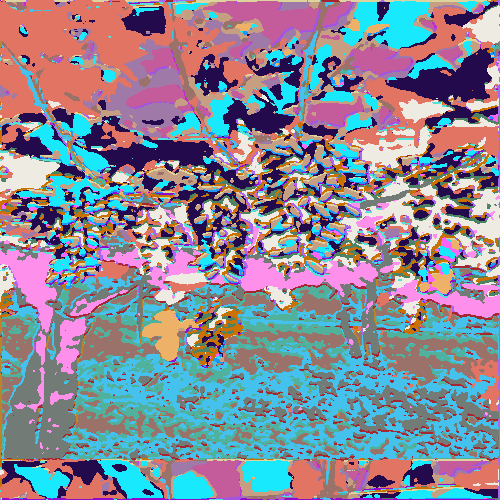

34 / 100 |  label num : 25  | loss : 0.537832498550415
Output: 


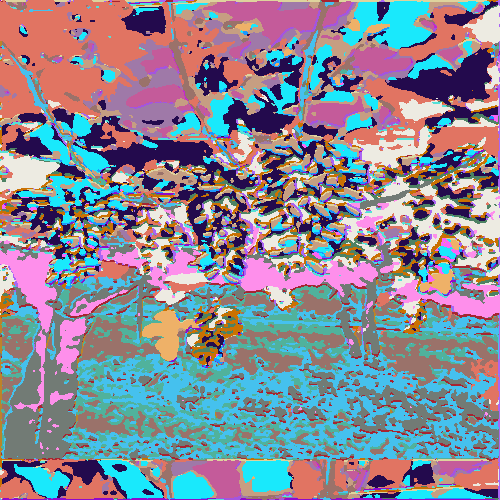

35 / 100 |  label num : 25  | loss : 0.5238770246505737
Output: 


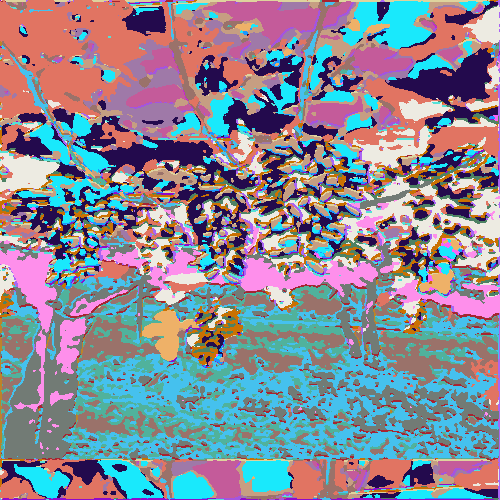

36 / 100 |  label num : 25  | loss : 0.5111613869667053
Output: 


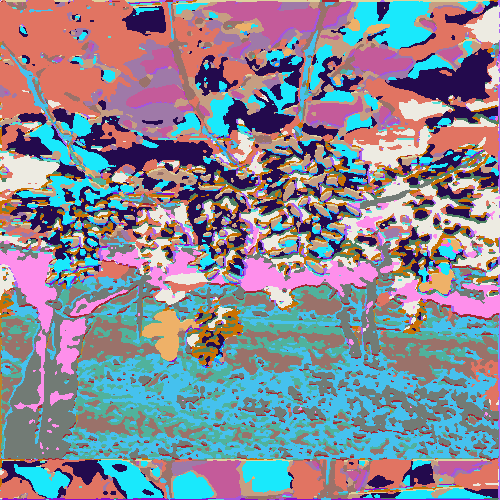

37 / 100 |  label num : 25  | loss : 0.4992414116859436
Output: 


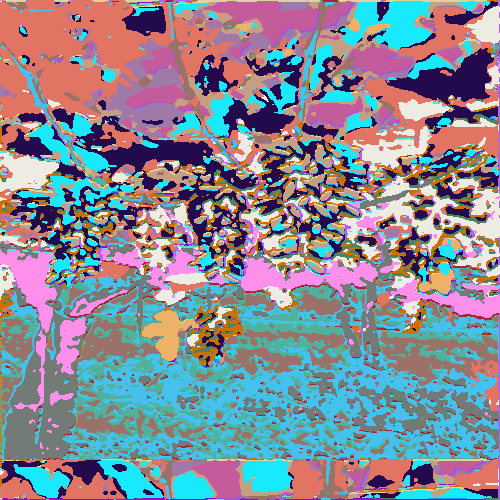

38 / 100 |  label num : 25  | loss : 0.48695969581604004
Output: 


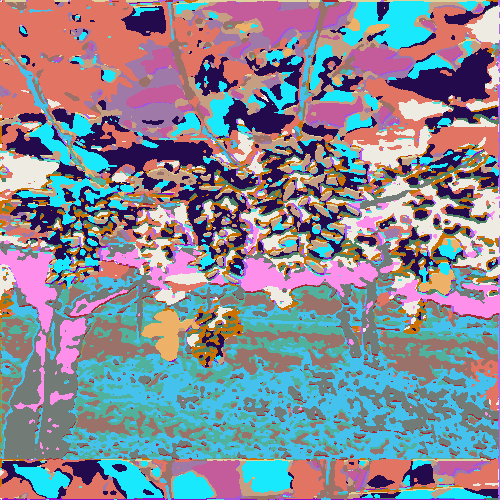

39 / 100 |  label num : 25  | loss : 0.47491908073425293
Output: 


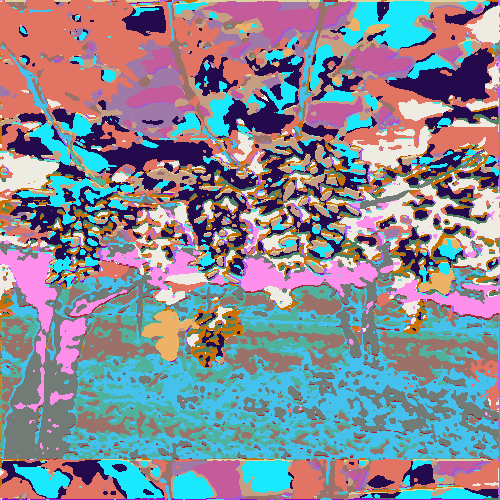

40 / 100 |  label num : 25  | loss : 0.46391987800598145
Output: 


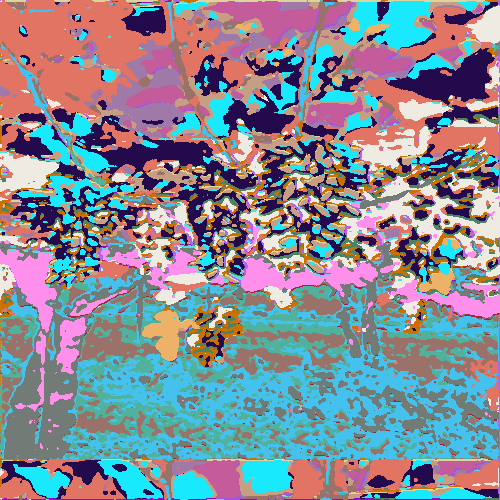

41 / 100 |  label num : 24  | loss : 0.4538953900337219
Output: 


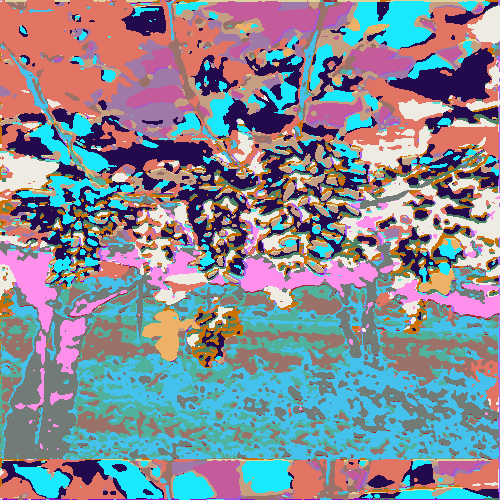

42 / 100 |  label num : 22  | loss : 0.4446295499801636
Output: 


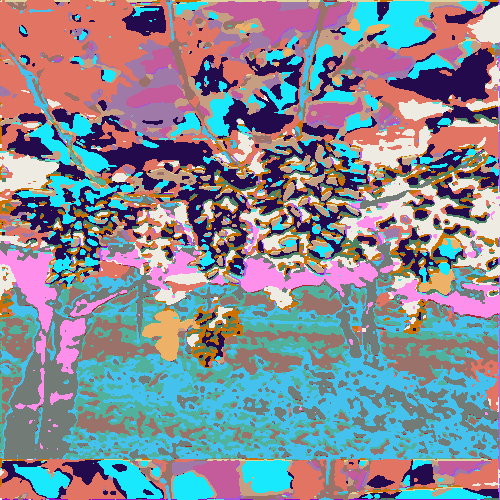

43 / 100 |  label num : 22  | loss : 0.43591833114624023
Output: 


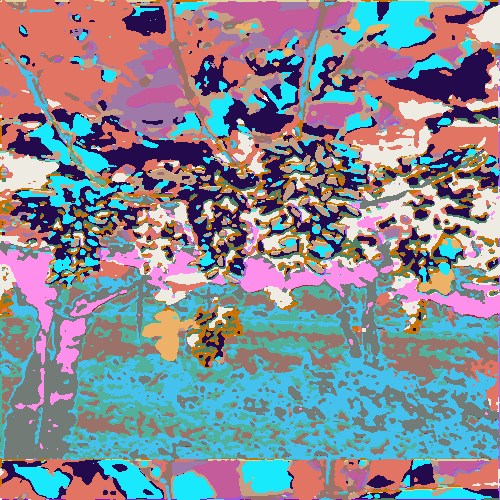

44 / 100 |  label num : 22  | loss : 0.42712345719337463
Output: 


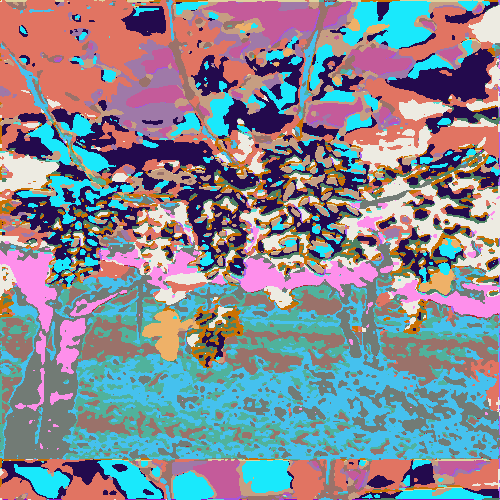

45 / 100 |  label num : 22  | loss : 0.41858258843421936
Output: 


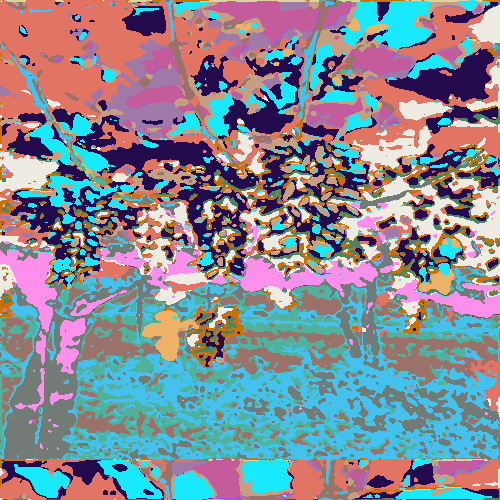

46 / 100 |  label num : 22  | loss : 0.4105876684188843
Output: 


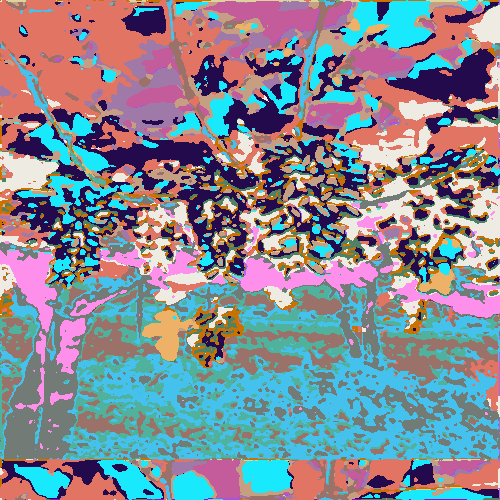

47 / 100 |  label num : 22  | loss : 0.4025682508945465
Output: 


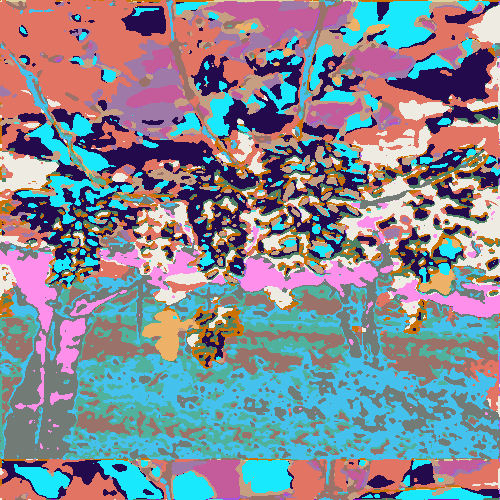

48 / 100 |  label num : 21  | loss : 0.39464330673217773
Output: 


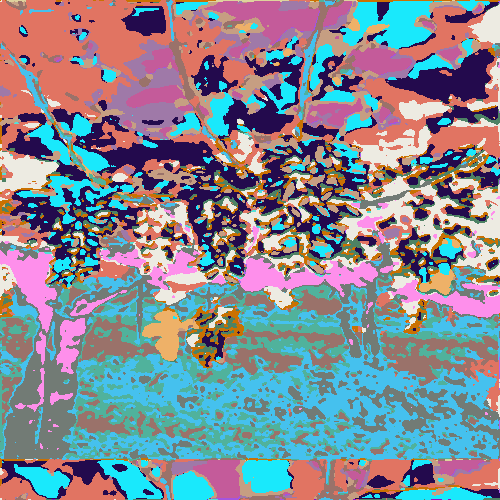

49 / 100 |  label num : 21  | loss : 0.38696956634521484
Output: 


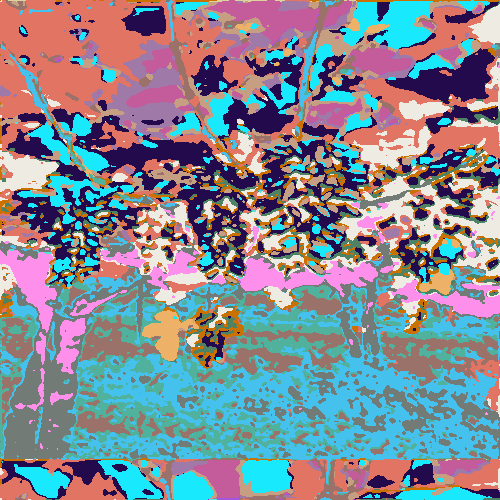

50 / 100 |  label num : 21  | loss : 0.37968459725379944
Output: 


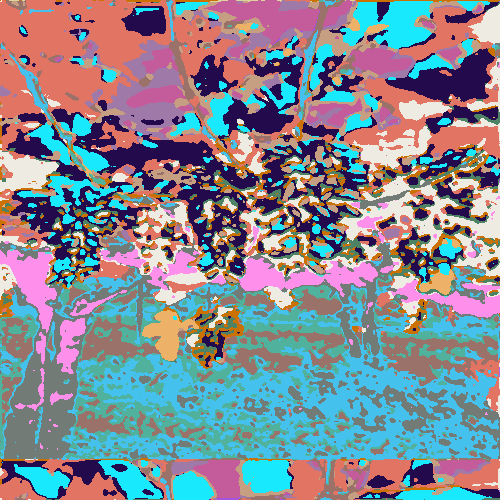

51 / 100 |  label num : 20  | loss : 0.372758150100708
Output: 


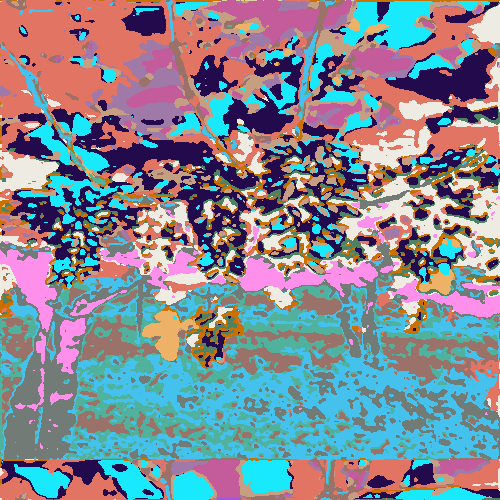

52 / 100 |  label num : 20  | loss : 0.36631542444229126
Output: 


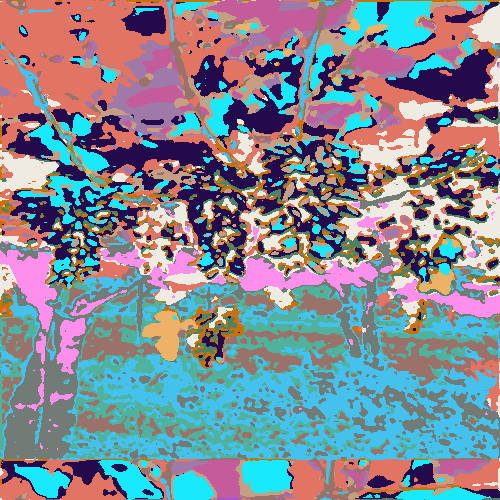

53 / 100 |  label num : 19  | loss : 0.36040443181991577
Output: 


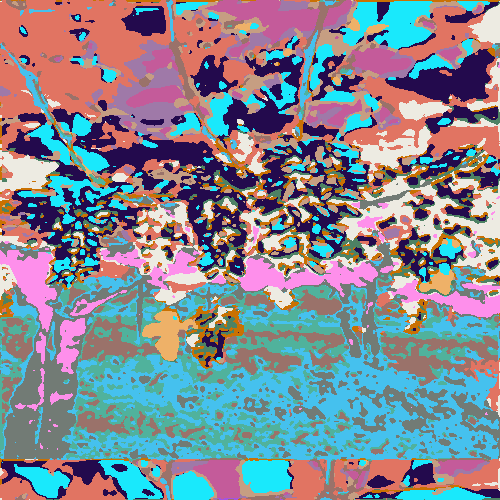

54 / 100 |  label num : 18  | loss : 0.3550163507461548
Output: 


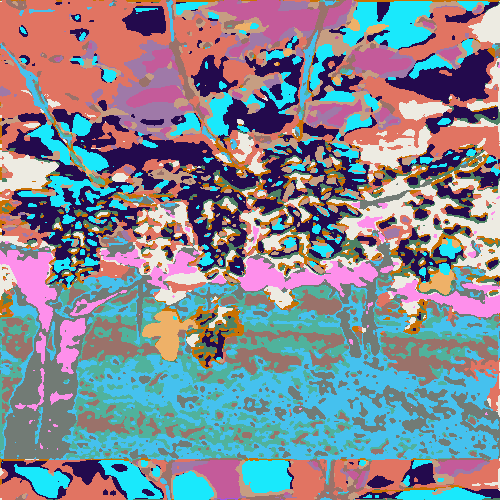

55 / 100 |  label num : 17  | loss : 0.35014528036117554
Output: 


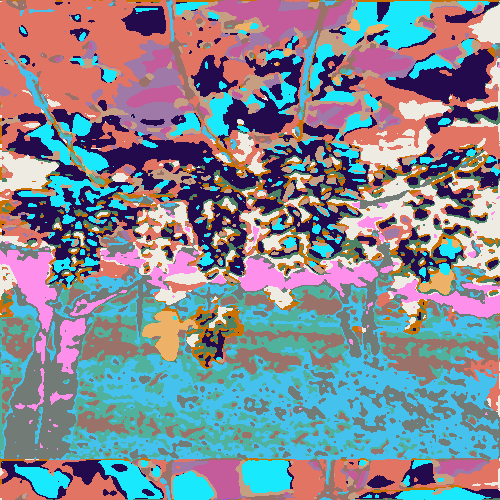

56 / 100 |  label num : 17  | loss : 0.3453902006149292
Output: 


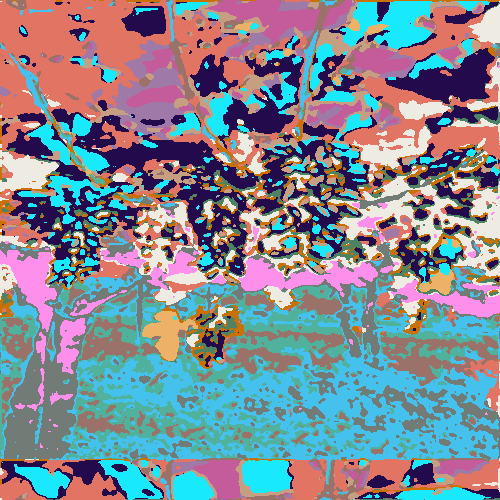

57 / 100 |  label num : 16  | loss : 0.3409911096096039
Output: 


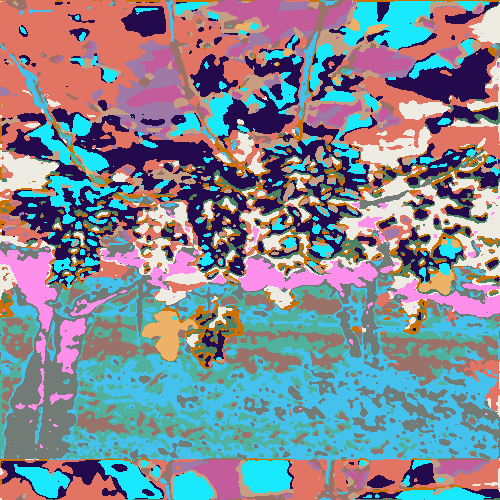

58 / 100 |  label num : 16  | loss : 0.33688831329345703
Output: 


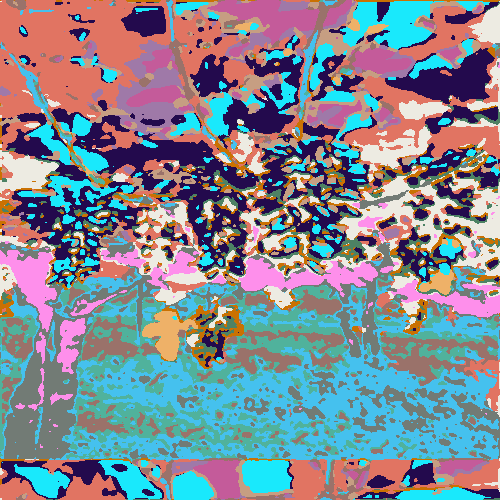

59 / 100 |  label num : 15  | loss : 0.3330775201320648
Output: 


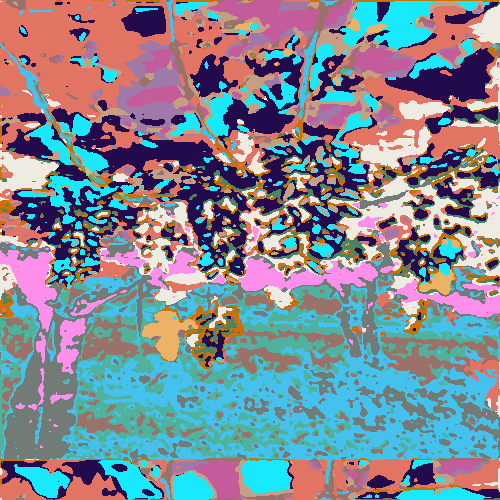

60 / 100 |  label num : 15  | loss : 0.3292728066444397
Output: 


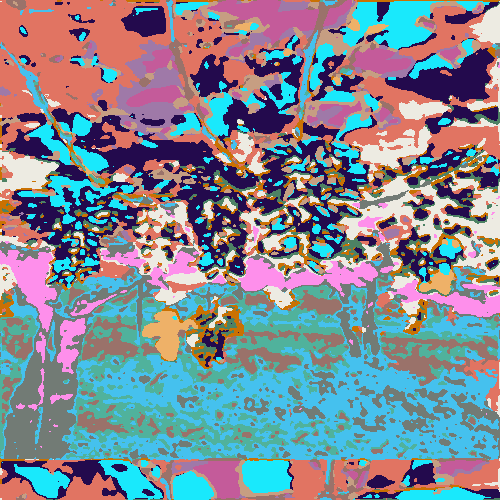

61 / 100 |  label num : 15  | loss : 0.3254069685935974
Output: 


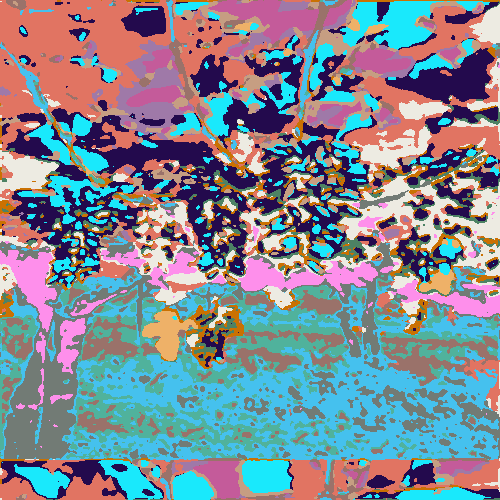

62 / 100 |  label num : 15  | loss : 0.3219102621078491
Output: 


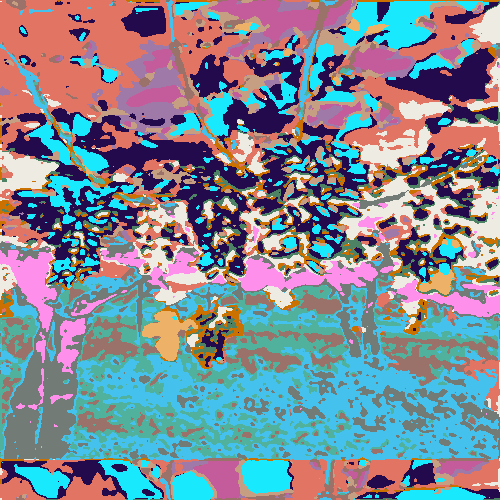

63 / 100 |  label num : 15  | loss : 0.31836897134780884
Output: 


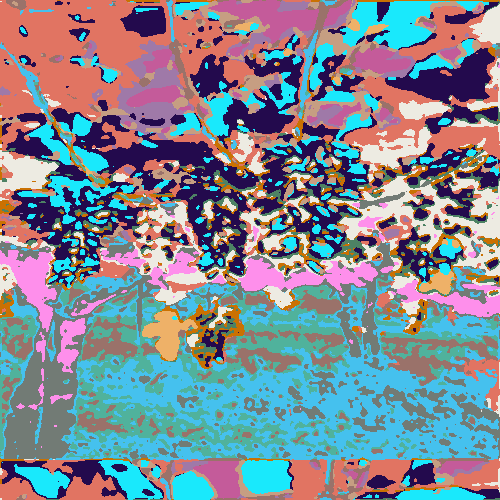

64 / 100 |  label num : 15  | loss : 0.3149241507053375
Output: 


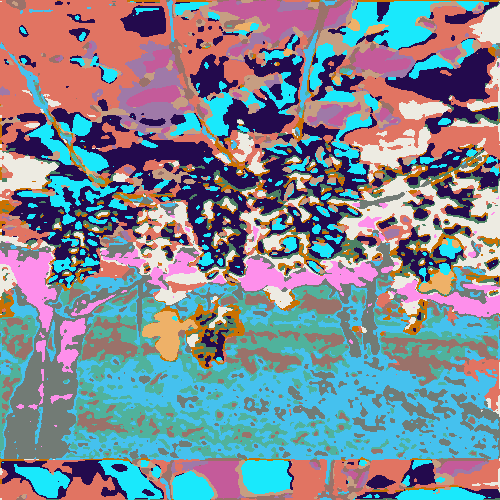

65 / 100 |  label num : 15  | loss : 0.3117775321006775
Output: 


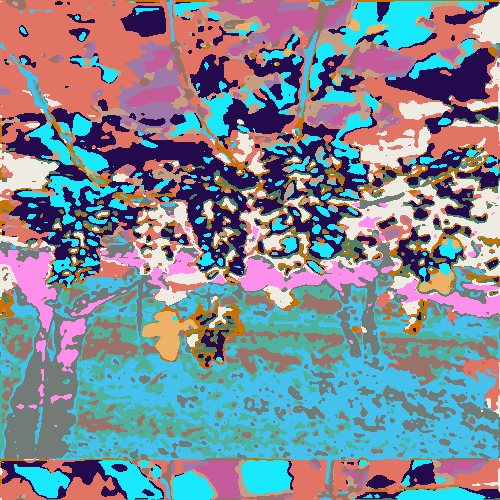

66 / 100 |  label num : 15  | loss : 0.30875957012176514
Output: 


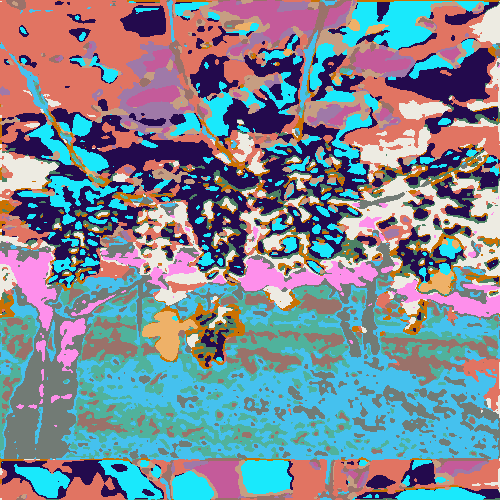

67 / 100 |  label num : 15  | loss : 0.3057521879673004
Output: 


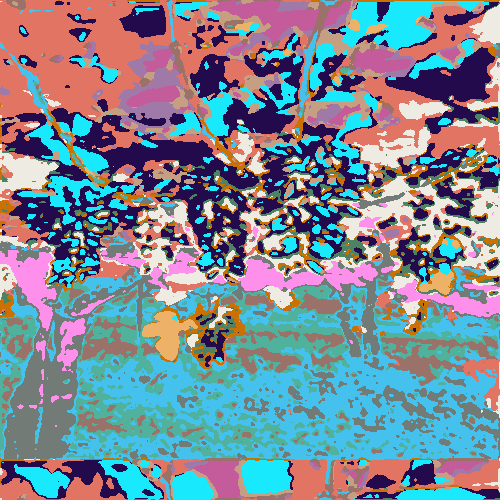

68 / 100 |  label num : 15  | loss : 0.3028748631477356
Output: 


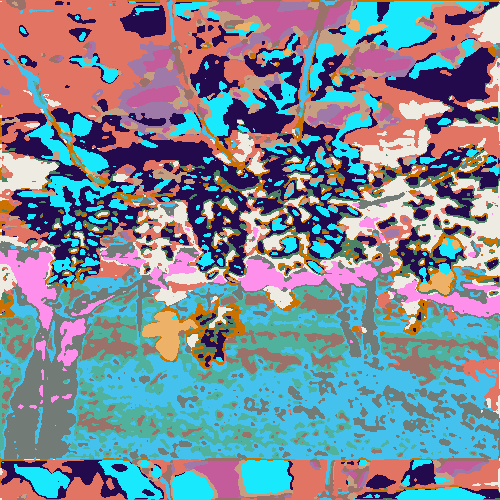

69 / 100 |  label num : 15  | loss : 0.2999119758605957
Output: 


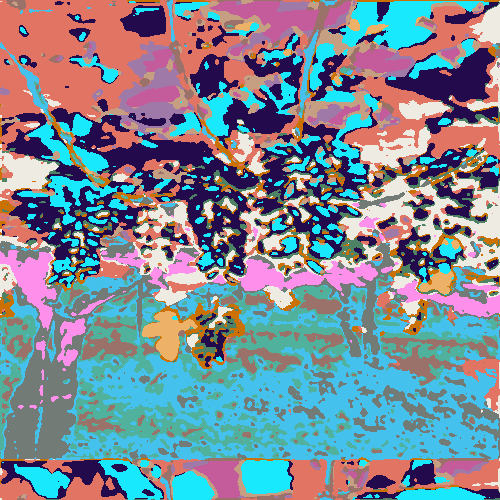

70 / 100 |  label num : 15  | loss : 0.29718223214149475
Output: 


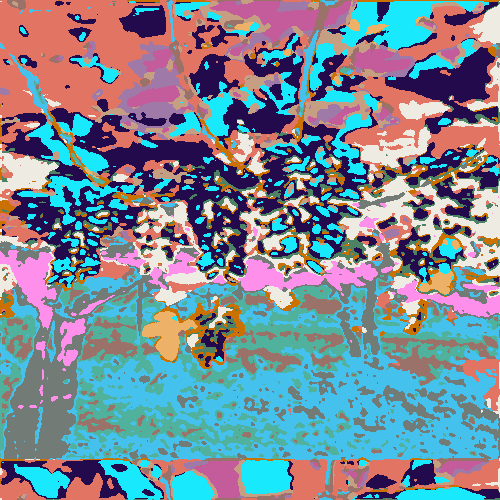

71 / 100 |  label num : 15  | loss : 0.2947404682636261
Output: 


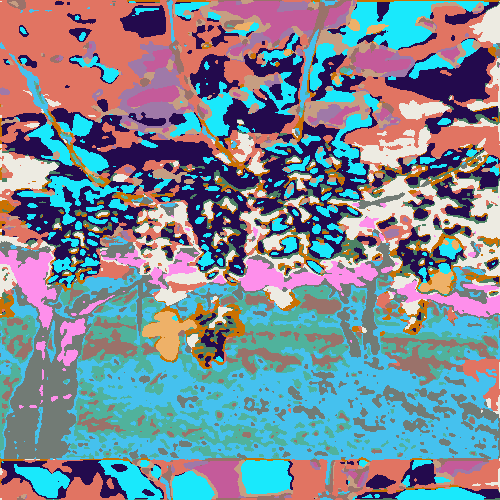

72 / 100 |  label num : 15  | loss : 0.2917976975440979
Output: 


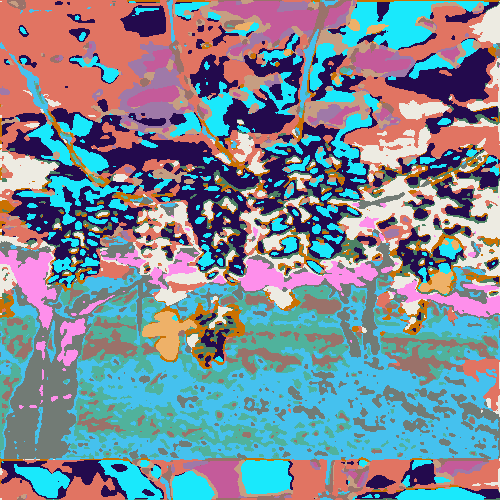

73 / 100 |  label num : 15  | loss : 0.28991571068763733
Output: 


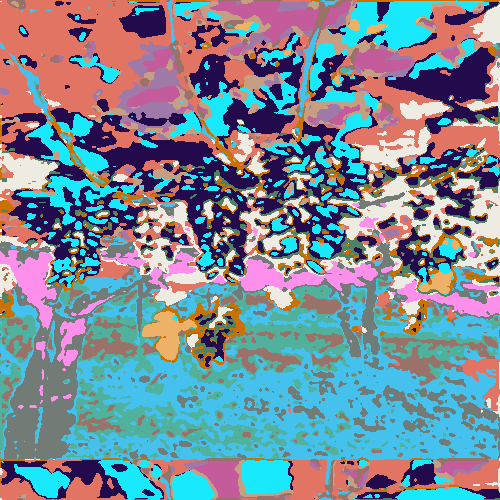

74 / 100 |  label num : 15  | loss : 0.2874782979488373
Output: 


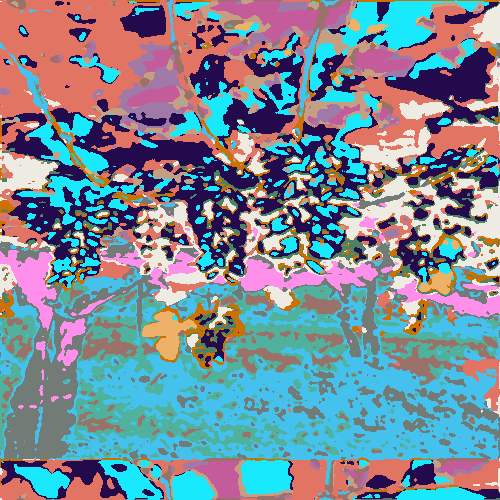

75 / 100 |  label num : 15  | loss : 0.28492605686187744
Output: 


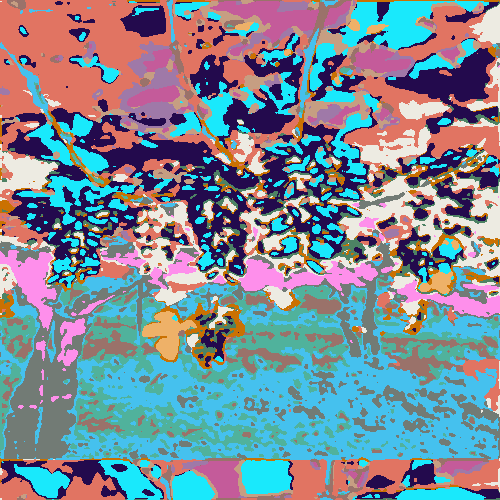

76 / 100 |  label num : 15  | loss : 0.2825685441493988
Output: 


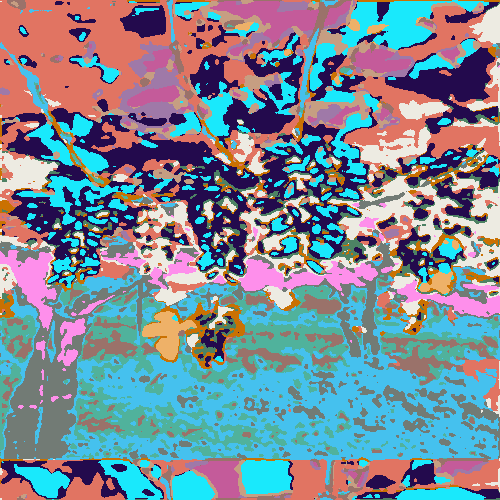

77 / 100 |  label num : 15  | loss : 0.2800016403198242
Output: 


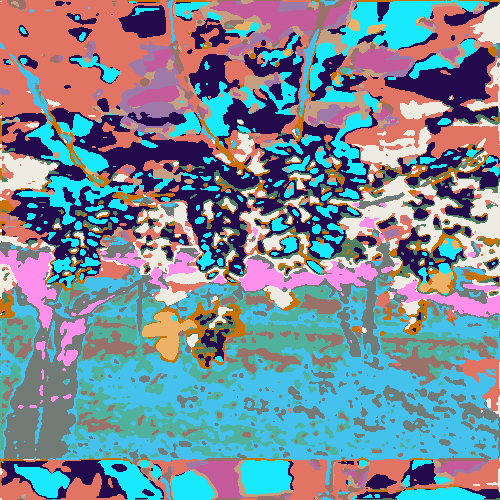

78 / 100 |  label num : 15  | loss : 0.27843406796455383
Output: 


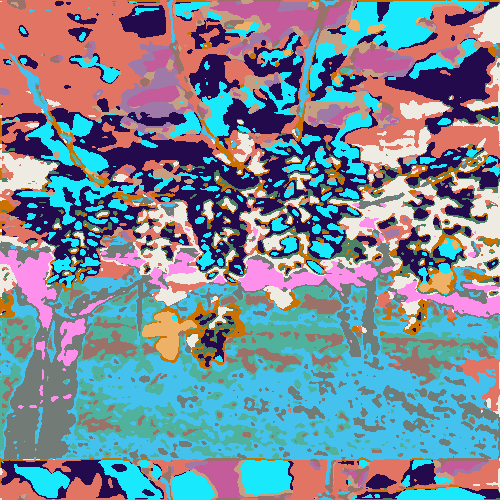

79 / 100 |  label num : 15  | loss : 0.27595552802085876
Output: 


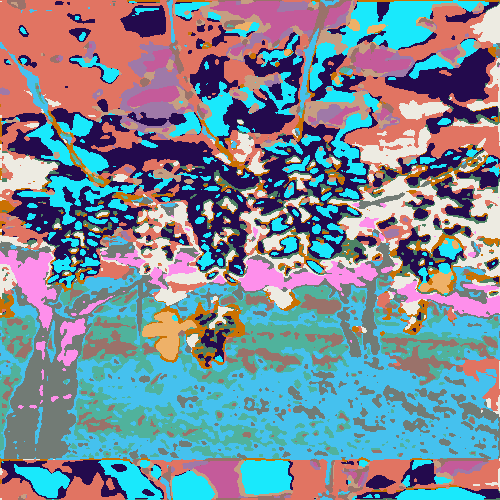

80 / 100 |  label num : 15  | loss : 0.2748008370399475
Output: 


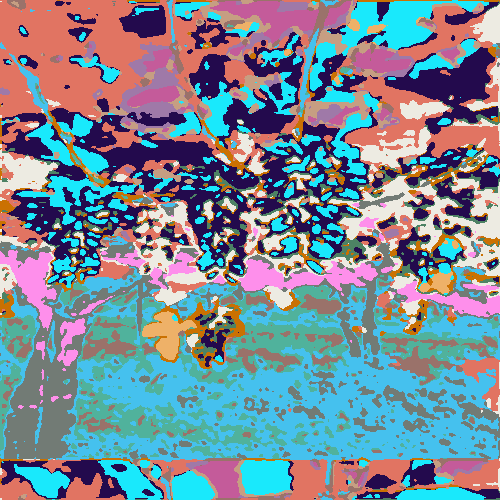

81 / 100 |  label num : 15  | loss : 0.2726278305053711
Output: 


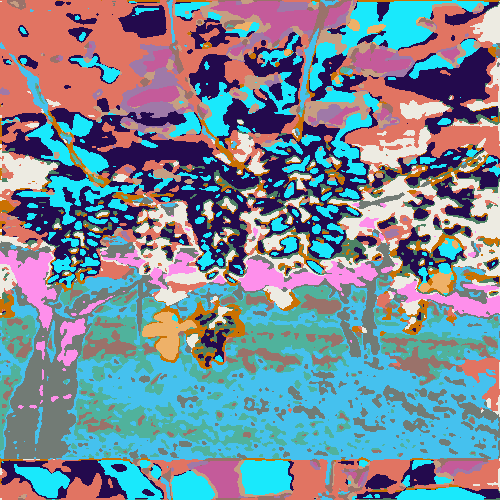

82 / 100 |  label num : 15  | loss : 0.27092045545578003
Output: 


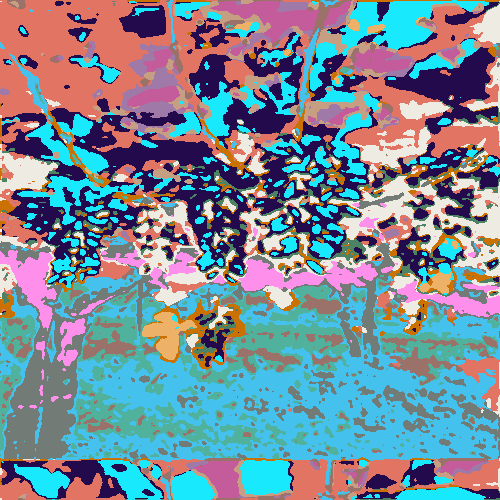

83 / 100 |  label num : 15  | loss : 0.26824796199798584
Output: 


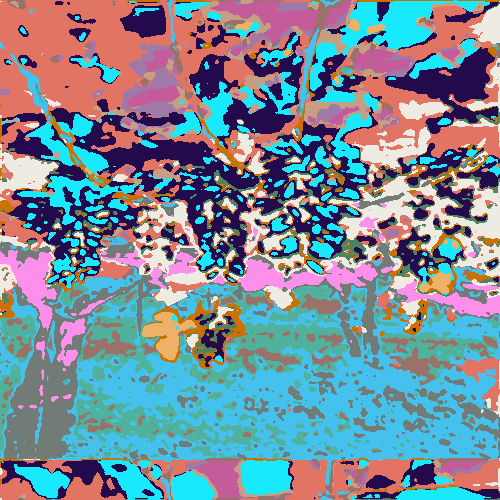

84 / 100 |  label num : 15  | loss : 0.26711663603782654
Output: 


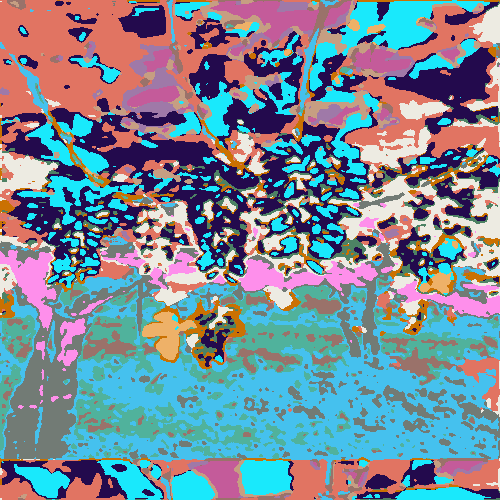

85 / 100 |  label num : 15  | loss : 0.26449665427207947
Output: 


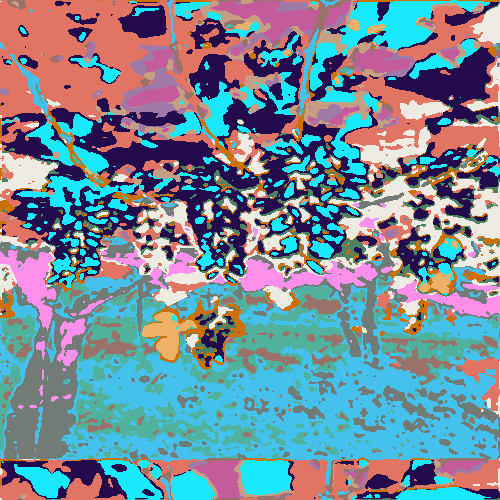

86 / 100 |  label num : 15  | loss : 0.26314184069633484
Output: 


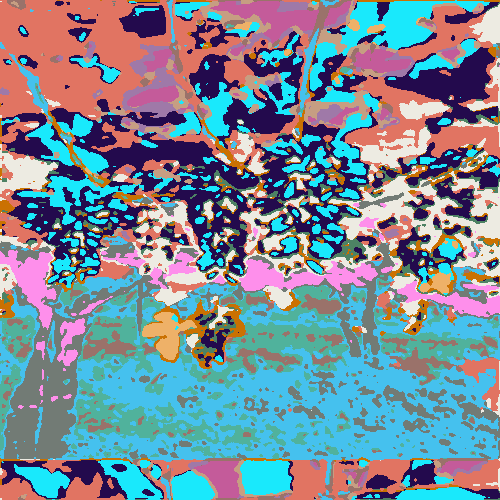

87 / 100 |  label num : 15  | loss : 0.26069390773773193
Output: 


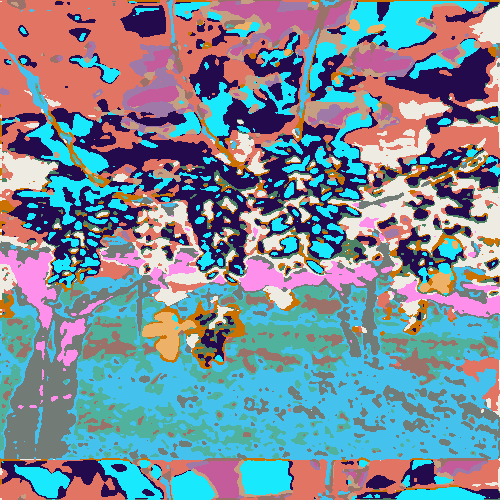

88 / 100 |  label num : 15  | loss : 0.26019030809402466
Output: 


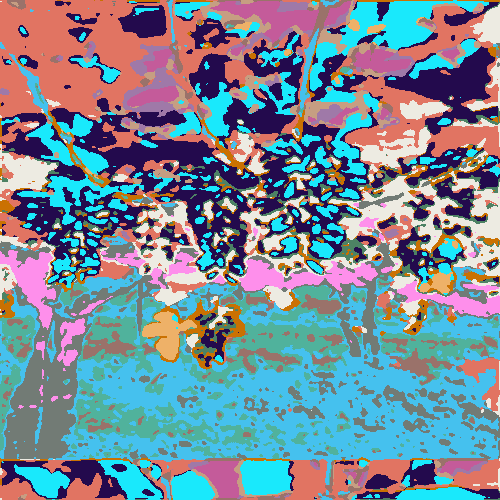

89 / 100 |  label num : 15  | loss : 0.2577267289161682
Output: 


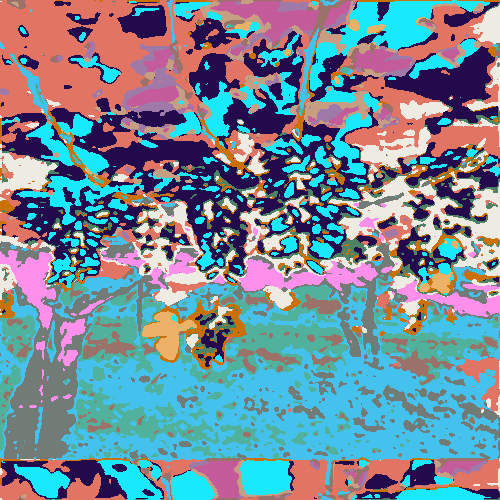

90 / 100 |  label num : 15  | loss : 0.2566864490509033
Output: 


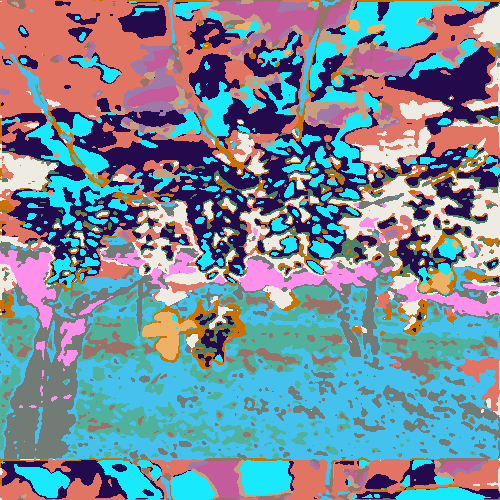

91 / 100 |  label num : 15  | loss : 0.2543043792247772
Output: 


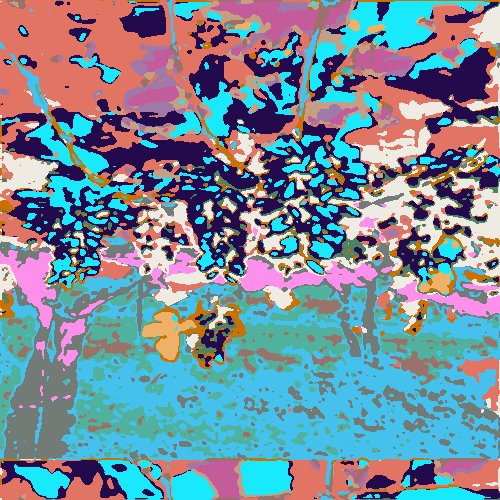

92 / 100 |  label num : 15  | loss : 0.25250643491744995
Output: 


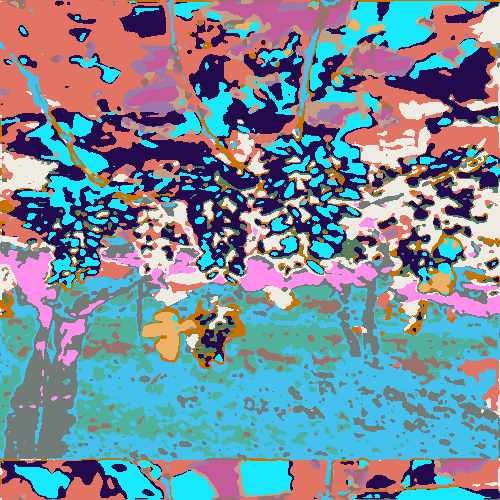

93 / 100 |  label num : 15  | loss : 0.2510696053504944
Output: 


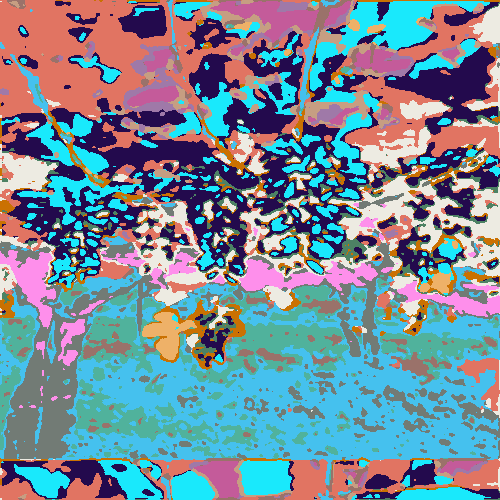

94 / 100 |  label num : 15  | loss : 0.2492198348045349
Output: 


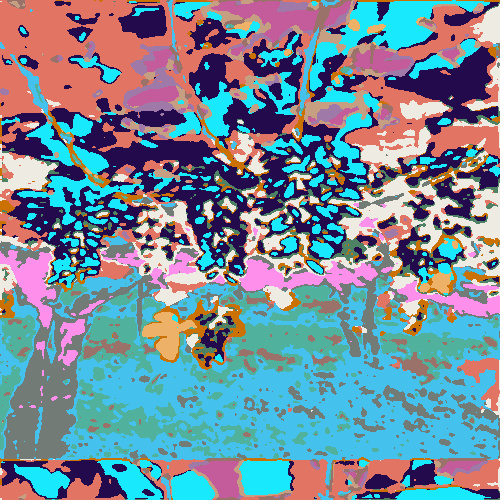

95 / 100 |  label num : 15  | loss : 0.24797779321670532
Output: 


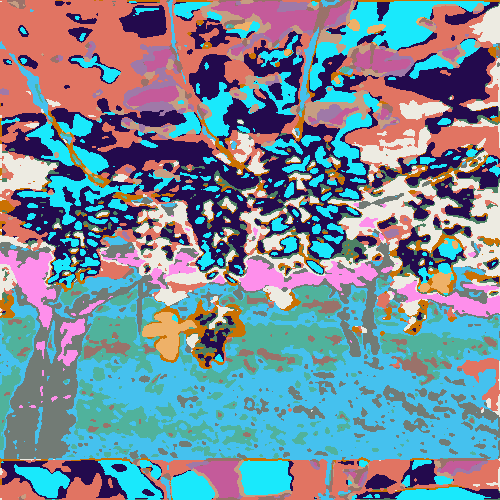

96 / 100 |  label num : 15  | loss : 0.24591565132141113
Output: 


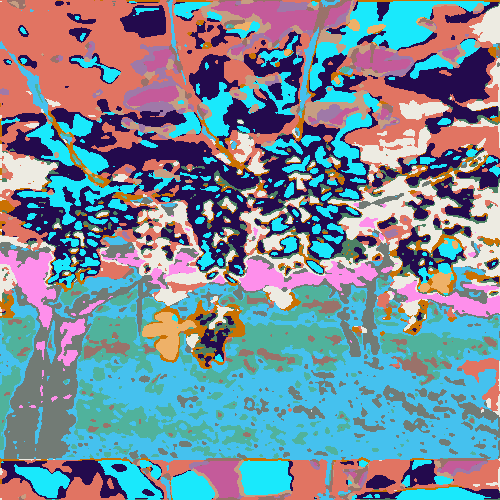

97 / 100 |  label num : 15  | loss : 0.24484777450561523
Output: 


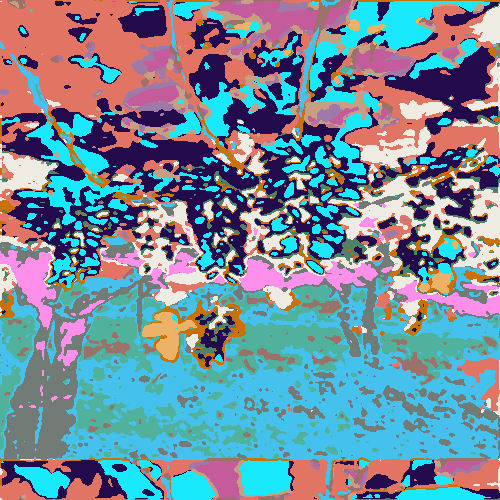

98 / 100 |  label num : 15  | loss : 0.24282559752464294
Output: 


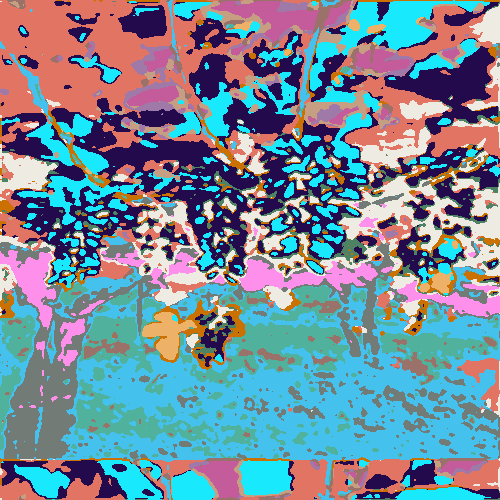

99 / 100 |  label num : 15  | loss : 0.24149200320243835


In [ ]:
for batch_idx in range(maxIter):
    # forwarding
    optimizer.zero_grad()
    output = model( data )[ 0 ]
    output = output.permute( 1, 2, 0 ).contiguous().view( -1, nChannel )

    outputHP = output.reshape( (im.shape[0], im.shape[1], nChannel) )
    HPy = outputHP[1:, :, :] - outputHP[0:-1, :, :]
    HPz = outputHP[:, 1:, :] - outputHP[:, 0:-1, :]
    lhpy = loss_hpy(HPy,HPy_target)
    lhpz = loss_hpz(HPz,HPz_target)

    ignore, target = torch.max( output, 1 )
    im_target = target.data.cpu().numpy()
    nLabels = len(np.unique(im_target))
    if visualize:
        im_target_rgb = np.array([label_colours[ c % nChannel ] for c in im_target])
        im_target_rgb = im_target_rgb.reshape( im.shape ).astype( np.uint8 )
        print("Output: ")
        cv2_imshow(im_target_rgb )
        cv2.waitKey(10)

    # loss
    if scribble:
        loss = stepsize_sim * loss_fn(output[ inds_sim ], target[ inds_sim ]) + stepsize_scr * loss_fn_scr(output[ inds_scr ], target_scr[ inds_scr ]) + stepsize_con * (lhpy + lhpz)
    else:
        loss = stepsize_sim * loss_fn(output, target) + stepsize_con * (lhpy + lhpz)

    loss.backward()
    optimizer.step()

    print (batch_idx, '/', maxIter, '|', ' label num :', nLabels, ' | loss :', loss.item())

    if nLabels <= minLabels:
        print ("nLabels", nLabels, "reached minLabels", minLabels, ".")
        break

In [ ]:
# save output image
if not visualize:
    output = model( data )[ 0 ]
    output = output.permute( 1, 2, 0 ).contiguous().view( -1, nChannel )
    ignore, target = torch.max( output, 1 )
    im_target = target.data.cpu().numpy()
    im_target_rgb = np.array([label_colours[ c % nChannel ] for c in im_target])
    im_target_rgb = im_target_rgb.reshape( im.shape ).astype( np.uint8 )
cv2.imwrite( "output.png", im_target_rgb )

True